# Audio

In [1]:
# autotime prints how long every cell took -- useful when you start timing
# model calls against API calls.
%load_ext autotime

time: 167 µs (started: 2026-08-25 21:09:28 +05:30)


In [2]:
import os, json, base64, subprocess, warnings
from pathlib import Path

import numpy as np
import librosa
import soundfile as sf
import torch
import cv2
import matplotlib.pyplot as plt
from IPython.display import Audio, display

%matplotlib inline
plt.rcParams.update({
    "figure.dpi": 110, "figure.facecolor": "white",
    "axes.facecolor": "#FCFAF4", "axes.grid": True,
    "grid.color": "#E6E0D4", "axes.titleweight": "bold", "font.size": 10,
})

device = ("cuda" if torch.cuda.is_available()
          else "mps" if torch.backends.mps.is_available() else "cpu")

print("numpy", np.__version__, "| librosa", librosa.__version__,
      "| torch", torch.__version__, "| cv2", cv2.__version__)
print("device:", device)

numpy 2.3.3 | librosa 0.11.0 | torch 2.10.0 | cv2 4.13.0
device: mps
time: 1.89 s (started: 2026-08-25 21:09:32 +05:30)


In [3]:
import textwrap
from dotenv import load_dotenv
from openai import OpenAI

# Optional -- only needed if you are behind a VPN, as I am.
import truststore
truststore.inject_into_ssl()


def pretty_print(*args):
    text = " ".join(str(arg) for arg in args)
    try:
        print(textwrap.fill(text, width=80))
    except Exception:
        print(text)


load_dotenv('/Users/shivam13juna/Documents/scaler/GEN_AI_REF/openai_key.env')

if not os.getenv("OPENAI_API_KEY"):
    raise ValueError("OPENAI_API_KEY not found! Check the path in load_dotenv above.")

client = OpenAI()
pretty_print("API key loaded, client ready.")

API key loaded, client ready.
time: 479 ms (started: 2026-08-25 21:09:42 +05:30)


In [4]:
# ---- everything the notebook is configured by, in one place ---------------

SR = 16_000                              # THE speech sample rate. Everything is 16k.

ASR_MODEL_ID = "openai/whisper-base.en"  # fast classroom default (73M params)
# ASR_MODEL_ID = "openai/whisper-large-v3-turbo"   # what you'd actually ship

VISION_MODEL = "gpt-5-nano"              # any vision model: gpt-4o, gpt-4.1, gpt-5-*
OPENAI_ASR   = "gpt-4o-transcribe"       # managed speech-to-text
OPENAI_TTS   = "gpt-4o-mini-tts"         # managed text-to-speech
SEGMENT_ASR  = "whisper-1"               # the only one that returns SEGMENT timestamps

VIDEO_PATH = "/Users/shivam13juna/Documents/scaler/GEN_AI_REF/AI Modalities: Video/videos/what_is_your_name.mp4"

CACHE = Path("audio_cache")              # pre-fetched clips live here

print("ASR (local) :", ASR_MODEL_ID)
print("vision      :", VISION_MODEL)
print("video       :", Path(VIDEO_PATH).name, "|  exists:", os.path.exists(VIDEO_PATH))

ASR (local) : openai/whisper-base.en
vision      : gpt-5-nano
video       : what_is_your_name.mp4 |  exists: True
time: 1.55 ms (started: 2026-08-25 21:10:56 +05:30)


In [6]:
#20Hz to 20kHz is the human hearing range. 16kHz is a good compromise for speech, and is what Whisper uses.

time: 118 µs (started: 2026-08-25 21:14:06 +05:30)


In [11]:
# Frequency = how fast the wave wobbles = what you hear as PITCH.
# Same amplitude (0.3) every time, so the ONLY thing changing is speed.
sr_demo, duration = 44_100, 2.0
t = np.linspace(0, duration, int(sr_demo * duration), endpoint=False)

for hz, label in [(100, "deep"), (1000, "sharp"), (10_000, "very sharp"),
                  (15_000, "near the top of adult hearing"), (18_000, "near the top of young adult hearing"), (20_000, "top of human hearing"), (25_000, "beyond human hearing")]:
    print(f"{hz:>6} Hz  ({label})")
    display(Audio(0.3 * np.sin(2 * np.pi * hz * t), rate=sr_demo))

   100 Hz  (deep)


  1000 Hz  (sharp)


 10000 Hz  (very sharp)


 15000 Hz  (near the top of adult hearing)


 18000 Hz  (near the top of young adult hearing)


 20000 Hz  (top of human hearing)


 25000 Hz  (beyond human hearing)


time: 10.4 ms (started: 2026-08-25 21:19:31 +05:30)


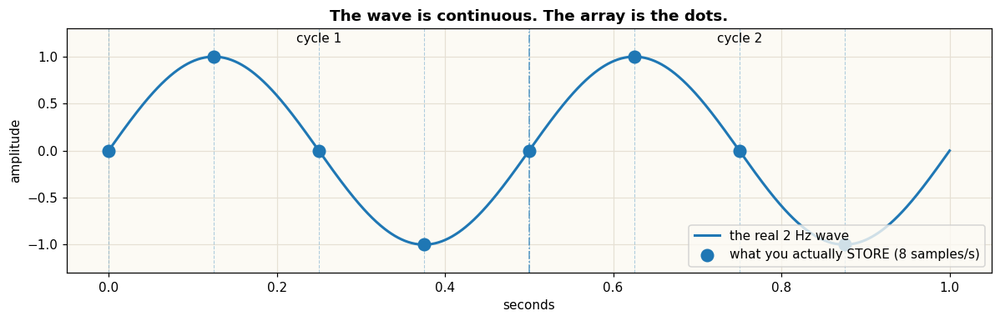

samples per cycle: 4.0
the array you'd store: [ 0.  1.  0. -1. -0.  1.  0. -1.]
time: 137 ms (started: 2026-08-25 21:21:43 +05:30)


In [12]:
sound_frequency = 2      # 2 cycles per second
sampling_rate   = 8      # 8 measurements per second

t_smooth  = np.linspace(0, 1.0, 1000)
y_smooth  = np.sin(2 * np.pi * sound_frequency * t_smooth)
t_samples = np.arange(0, 1.0, 1 / sampling_rate)
y_samples = np.sin(2 * np.pi * sound_frequency * t_samples)

plt.figure(figsize=(11, 3.6))
plt.plot(t_smooth, y_smooth, lw=2, label=f"the real {sound_frequency} Hz wave")
plt.scatter(t_samples, y_samples, s=90, zorder=3,
            label=f"what you actually STORE ({sampling_rate} samples/s)")
for tick in t_samples:
    plt.axvline(tick, ls="--", lw=0.7, alpha=0.35)
plt.axvline(0.5, ls="-.", lw=1, alpha=0.7)
plt.text(0.25, 1.15, "cycle 1", ha="center"); plt.text(0.75, 1.15, "cycle 2", ha="center")
plt.title("The wave is continuous. The array is the dots."); plt.xlabel("seconds")
plt.ylabel("amplitude"); plt.ylim(-1.3, 1.3); plt.legend(loc="lower right")
plt.tight_layout(); plt.show()

print("samples per cycle:", sampling_rate / sound_frequency)
print("the array you'd store:", np.round(y_samples, 2))

In [ ]:
# A cached LibriSpeech clip. Decoded with soundfile (never torchcodec).
y16, sr0 = sf.read(CACHE / "librispeech_dummy.wav", dtype="float32")
ref_text = json.load(open(CACHE / "librispeech_dummy_meta.json"))["ref_text"]

print(f"samples  : {len(y16):,}   sr: {sr0} Hz   duration: {len(y16)/sr0:.2f}s")
print(f"dtype    : {y16.dtype}   range: [{y16.min():+.3f}, {y16.max():+.3f}]"
      "   <- floats in [-1, 1], which is what models want")
print(f"reference: {ref_text!r}")
display(Audio(y16, rate=SR))

samples  : 93,680   sr: 16000 Hz   duration: 5.86s
dtype    : float32   range: [-0.339, +0.388]   <- floats in [-1, 1], which is what models want
reference: 'MISTER QUILTER IS THE APOSTLE OF THE MIDDLE CLASSES AND WE ARE GLAD TO WELCOME HIS GOSPEL'


time: 2.58 ms (started: 2026-08-25 21:29:54 +05:30)


16k times in a second. 

In [13]:
import transformers
from transformers import WhisperProcessor, WhisperForConditionalGeneration

warnings.filterwarnings("ignore")
transformers.logging.set_verbosity_error()   # HF's generation notices are noisy in class

processor = WhisperProcessor.from_pretrained(ASR_MODEL_ID)
model = WhisperForConditionalGeneration.from_pretrained(ASR_MODEL_ID).to(device).eval()

n_params = sum(p.numel() for p in model.parameters()) / 1e6
print(f"loaded {ASR_MODEL_ID}  (~{n_params:.0f}M params) on {device}")

objc[15114]: Class AVFFrameReceiver is implemented in both /Users/shivam13juna/Documents/virtual_envs/dev3.12/lib/python3.12/site-packages/cv2/.dylibs/libavdevice.61.3.100.dylib (0x1158f03a8) and /Users/shivam13juna/Documents/virtual_envs/dev3.12/lib/python3.12/site-packages/av/.dylibs/libavdevice.62.1.100.dylib (0x11edac3a8). This may cause spurious casting failures and mysterious crashes. One of the duplicates must be removed or renamed.
objc[15114]: Class AVFAudioReceiver is implemented in both /Users/shivam13juna/Documents/virtual_envs/dev3.12/lib/python3.12/site-packages/cv2/.dylibs/libavdevice.61.3.100.dylib (0x1158f03f8) and /Users/shivam13juna/Documents/virtual_envs/dev3.12/lib/python3.12/site-packages/av/.dylibs/libavdevice.62.1.100.dylib (0x11edac3f8). This may cause spurious casting failures and mysterious crashes. One of the duplicates must be removed or renamed.
Skipping import of cpp extensions due to incompatible torch version. Please upgrade to torch >= 2.11.0 (found 2.

Loading weights:   0%|          | 0/245 [00:00<?, ?it/s]

loaded openai/whisper-base.en  (~73M params) on mps
time: 13.5 s (started: 2026-08-25 21:28:51 +05:30)


In [17]:
# NOTE sampling_rate=16_000. This MUST match the audio's true rate --
# it is the Part 3 footgun, made concrete right here.
feats = processor(y16, sampling_rate=SR, return_tensors="pt").input_features.to(device)
print("input_features:", tuple(feats.shape), "= (batch, 80 mel bands, frames)")

with torch.no_grad():
    ids = model.generate(feats, max_new_tokens=128)

hyp = processor.batch_decode(ids, skip_special_tokens=True)[0].strip()
print("\nhypothesis:", hyp)
print("reference :", ref_text)

input_features: (1, 80, 3000) = (batch, 80 mel bands, frames)

hypothesis: Mr. Quilter is the apostle of the middle classes, and we are glad to welcome his gospel.
reference : MISTER QUILTER IS THE APOSTLE OF THE MIDDLE CLASSES AND WE ARE GLAD TO WELCOME HIS GOSPEL
time: 918 ms (started: 2026-08-25 21:31:50 +05:30)


In [18]:
from jiwer import wer

_ref = "the quick brown fox jumps over the lazy dog"
_hyp = "the quick brown fox jump over lazy dog"       # 1 substitution + 1 deletion

print("reference :", _ref)
print("hypothesis:", _hyp)
print(f"WER       : {wer(_ref, _hyp):.3f}   (2 errors / 9 reference words)")

reference : the quick brown fox jumps over the lazy dog
hypothesis: the quick brown fox jump over lazy dog
WER       : 0.222   (2 errors / 9 reference words)
time: 64.1 ms (started: 2026-08-25 21:35:07 +05:30)


In [20]:
vad_model, vad_utils = torch.hub.load("snakers4/silero-vad", "silero_vad",
                                      trust_repo=True)
get_speech_timestamps = vad_utils[0]

# Silero wants 16 kHz mono float32 as a torch tensor.
speech = get_speech_timestamps(torch.from_numpy(np.ascontiguousarray(y16)),
                               vad_model, sampling_rate=SR, return_seconds=True)

print(f"clip is {len(y16)/SR:.2f}s long; VAD found {len(speech)} speech segment(s):")
for s in speech:
    print(f"  speech {s['start']:.2f}s -> {s['end']:.2f}s")

clip is 5.86s long; VAD found 1 speech segment(s):
  speech 0.50s -> 5.50s
time: 423 ms (started: 2026-08-25 21:38:54 +05:30)


Using cache found in /Users/shivam13juna/.cache/torch/hub/snakers4_silero-vad_master


In [19]:
# --- speech -> text --------------------------------------------------------
with open("test_audio.wav", "rb") as audio_file:
    transcription = client.audio.transcriptions.create(
        model=OPENAI_ASR,
        file=audio_file,
    )

print("transcribed:", transcription.text)

# Audio is billed as TOKENS too -- and they are input tokens, like any prompt.
u = transcription.usage
print("\ninput tokens :", u.input_tokens, " of which audio:",
      u.input_token_details.audio_tokens)
print("output tokens:", u.output_tokens, "| total:", u.total_tokens)

transcribed: Hello testing one two three.

input tokens : 34  of which audio: 34
output tokens: 8 | total: 42
time: 2.93 s (started: 2026-08-25 21:37:00 +05:30)


In [21]:
# --- text -> speech --------------------------------------------------------
speech_file_path = Path("tutor_voice.mp3")

with client.audio.speech.with_streaming_response.create(
    model=OPENAI_TTS,
    voice="nova",                      # alloy, echo, fable, onyx, nova, shimmer
    input="Hello students! Today we will explore AI that can see, listen, and speak. And also eat your wallet."
) as response:
    response.stream_to_file(speech_file_path)

print("saved:", speech_file_path, f"({speech_file_path.stat().st_size/1024:.0f} KB)")
display(Audio(str(speech_file_path)))

saved: tutor_voice.mp3 (125 KB)


time: 4.05 s (started: 2026-08-25 21:40:33 +05:30)


# Video Understanding

In [22]:
# --- 1) an image by URL, cheap setting -------------------------------------
IMAGE_URL = "https://www.animesenpai.net/wp-content/uploads/2023/12/sef-min.png.webp"

vision_response = client.chat.completions.create(
    model=VISION_MODEL,
    messages=[
        {"role": "system",
         "content": "You are an art critic who gives gentle feedback on illustrations."},
        {"role": "user", "content": [
            {"type": "text", "text": "Analyze this illustration in 3 sentences."},
            {"type": "image_url", "image_url": {
                "url": IMAGE_URL,
                "detail": "low",          # "low" | "high" | "auto"
            }},
        ]},
    ],
)

pretty_print("=== detail='low' ===")
pretty_print(vision_response.choices[0].message.content)
print("\nprompt tokens:", vision_response.usage.prompt_tokens)

=== detail='low' ===
The creature’s anatomy is bold and graphic, with sculpted ribcage and abdominal
ridges rendered in cool desaturated blues that give it an ethereal, almost
undead presence. Its elongated limbs, curved tail, and ribbon-like appendages
create a dramatic vertical silhouette that leads the eye upward, while the mask-
like head and spiky crest suggest a feral, otherworldly design. The foggy, low-
key background and soft bokeh isolate the figure as the focal point, lending the
scene a restrained, ominous grandeur.

prompt tokens: 820
time: 8.2 s (started: 2026-08-25 21:55:59 +05:30)


In [23]:
# --- 2) what does `detail` actually cost? ----------------------------------
# Same image, same question, four ways. Only the PROMPT tokens matter here.
for model in ["gpt-4o-mini", VISION_MODEL]:
    for detail in ["low", "high"]:
        r = client.chat.completions.create(
            model=model,
            messages=[{"role": "user", "content": [
                {"type": "text", "text": "One word: what is this?"},
                {"type": "image_url", "image_url": {"url": IMAGE_URL, "detail": detail}},
            ]}],
        )
        print(f"{model:12}  detail={detail:5}  ->  prompt tokens: {r.usage.prompt_tokens:>7,}")

gpt-4o-mini   detail=low    ->  prompt tokens:   2,847
gpt-4o-mini   detail=high   ->  prompt tokens:  25,515
gpt-5-nano    detail=low    ->  prompt tokens:     803
gpt-5-nano    detail=high   ->  prompt tokens:     803
time: 18.1 s (started: 2026-08-25 21:57:53 +05:30)


## Let's work with Video

In [24]:
# Read metadata WITHOUT decoding a single frame (cheap).
cap      = cv2.VideoCapture(VIDEO_PATH)
fps      = cap.get(cv2.CAP_PROP_FPS) or 25.0
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
H        = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
W        = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
cap.release()

print(f"shape (T,H,W,C) : ({n_frames}, {H}, {W}, 3)")
print(f"fps / duration  : {fps:.2f} fps  /  {n_frames/fps:.1f} s")
print(f"raw decoded RGB : {n_frames * H * W * 3 / 1e6:,.0f} MB in memory")

# The translation that actually drives every decision: frames -> tokens -> dollars.
TOK_PER_HIGH_FRAME = 765          # ~a 1024px frame at detail="high"
PRICE_PER_1M_INPUT = 2.50         # illustrative $ / 1M input tokens -- CHECK CURRENT PRICING
tok_all = n_frames * TOK_PER_HIGH_FRAME

print(f"\nif you naively sent EVERY frame at high detail:")
print(f"  {n_frames} frames x {TOK_PER_HIGH_FRAME} tok = {tok_all:,} image-tokens")
print(f"  ~= {tok_all/128_000:.1f}x a 128k context window, "
      f"~${tok_all/1e6*PRICE_PER_1M_INPUT:,.2f} per call")
print("  -> impossible. The whole game is sampling FEW frames well.")

shape (T,H,W,C) : (2624, 720, 1280, 3)
fps / duration  : 29.97 fps  /  87.6 s
raw decoded RGB : 7,255 MB in memory

if you naively sent EVERY frame at high detail:
  2624 frames x 765 tok = 2,007,360 image-tokens
  ~= 15.7x a 128k context window, ~$5.02 per call
  -> impossible. The whole game is sampling FEW frames well.
time: 29.8 ms (started: 2026-08-25 22:00:43 +05:30)


In [25]:
NUM_FRAMES, MAX_SIDE = 12, 512

# Which frame indices do we want? Uniformly spaced across the whole clip.
wanted = set(np.linspace(0, n_frames - 1, NUM_FRAMES).round().astype(int).tolist())

cap = cv2.VideoCapture(VIDEO_PATH)
frames, stamps, i = [], [], 0
while True:
    ok, bgr = cap.read()               # decode SEQUENTIALLY -- seeking lies on some codecs
    if not ok:
        break
    if i in wanted:
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)      # GOTCHA: OpenCV decodes BGR!
        h, w = rgb.shape[:2]
        scale = min(1.0, MAX_SIDE / max(h, w))          # shrink only, never upscale
        if scale < 1.0:
            rgb = cv2.resize(rgb, (int(w * scale), int(h * scale)))
        frames.append(rgb)
        stamps.append(i / fps)                          # REMEMBER WHEN -- Part 8 needs it
    i += 1
cap.release()

print(f"decoded {i} frames, kept {len(frames)}")
print(f"timestamps (s): {[round(t, 1) for t in stamps]}")
print(f"frame shape after resize: {frames[0].shape}")

decoded 2624 frames, kept 12
timestamps (s): [0.0, 7.9, 15.9, 23.9, 31.8, 39.8, 47.7, 55.7, 63.7, 71.6, 79.6, 87.5]
frame shape after resize: (288, 512, 3)
time: 1.71 s (started: 2026-08-25 22:02:58 +05:30)


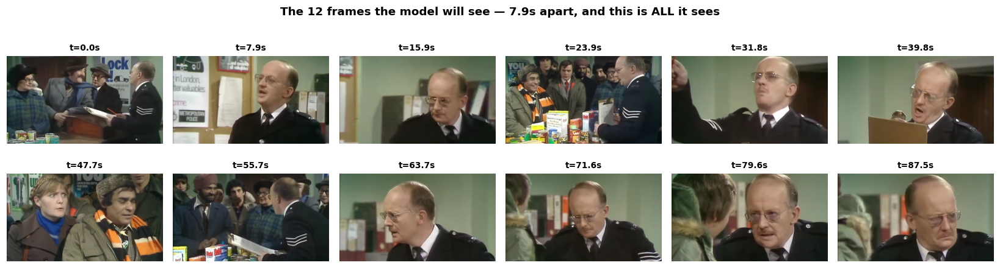

time: 211 ms (started: 2026-08-25 22:03:31 +05:30)


In [26]:
# Look at exactly what the model will receive. Nothing else -- no motion,
# no audio, no order, unless you say so.
fig, ax = plt.subplots(2, 6, figsize=(15, 4.4))
for a in ax.ravel():
    a.axis("off")
for a, f, t in zip(ax.ravel(), frames, stamps):
    a.imshow(f); a.set_title(f"t={t:.1f}s", fontsize=9)
fig.suptitle(f"The {len(frames)} frames the model will see — {stamps[1]-stamps[0]:.1f}s apart, "
             "and this is ALL it sees", fontweight="bold")
fig.tight_layout(); plt.show()

message has 26 parts: 1 preamble + 12 labels + 12 images + 1 question


[{'type': 'text',
  'text': 'These are frames sampled IN ORDER from one short video; each is labeled with its timestamp. Reason about what happens over time.'},
 {'type': 'text', 'text': '[frame @ 0.0s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 7.9s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 15.9s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 23.9s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 31.8s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 39.8s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 47.7s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text
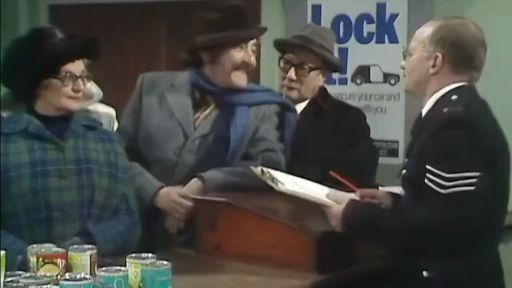
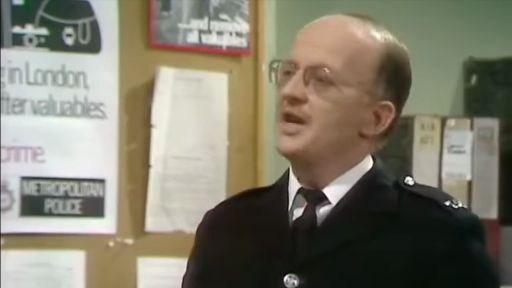
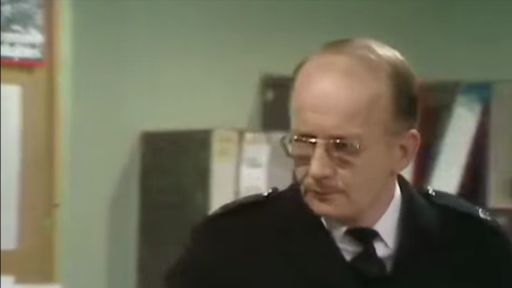
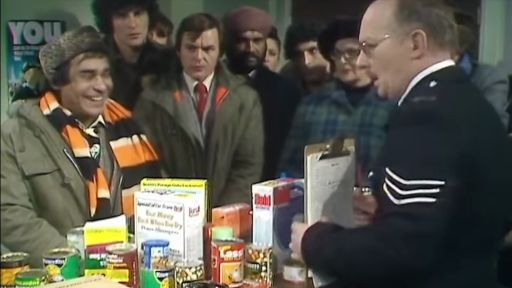
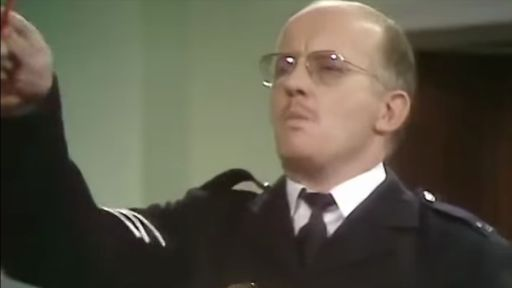
...
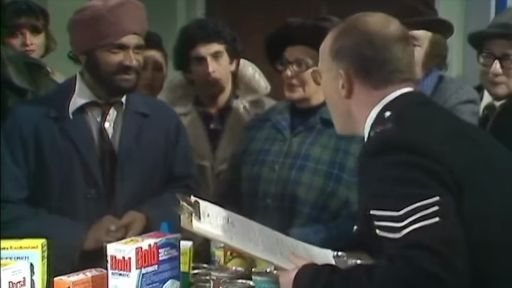
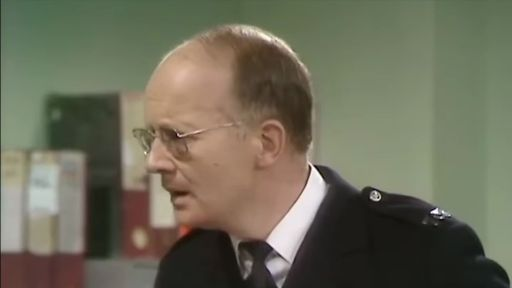
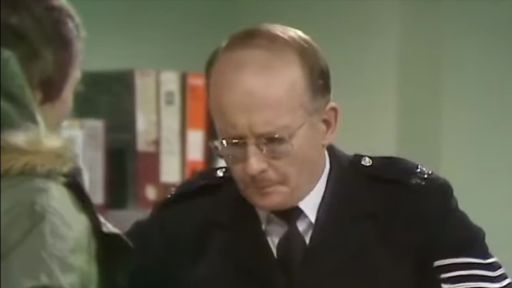
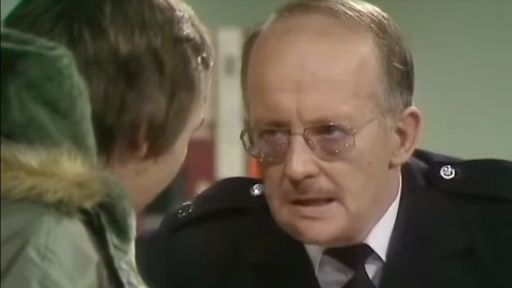
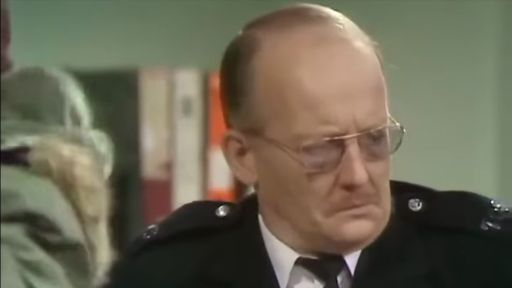

time: 7.37 ms (started: 2026-08-25 22:06:40 +05:30)


In [29]:
def frame_to_data_url(rgb, quality=80):
    bgr = cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)          # imencode wants BGR back
    ok, buf = cv2.imencode(".jpg", bgr, [cv2.IMWRITE_JPEG_QUALITY, quality])
    return "data:image/jpeg;base64," + base64.b64encode(buf).decode("ascii")


content = [{"type": "text",
            "text": ("These are frames sampled IN ORDER from one short video; each is "
                     "labeled with its timestamp. Reason about what happens over time.")}]

for t, f in zip(stamps, frames):
    content.append({"type": "text", "text": f"[frame @ {t:.1f}s]"})      # order + time
    content.append({"type": "image_url",
                    "image_url": {"url": frame_to_data_url(f), "detail": "low"}})

content.append({"type": "text",
                "text": "In 2-3 sentences, describe what happens across the clip."})

print(f"message has {len(content)} parts: 1 preamble + "
      f"{len(frames)} labels + {len(frames)} images + 1 question")

content

In [30]:

# GOTCHA: gpt-5-* are REASONING models. Hidden reasoning tokens are billed against
# max_completion_tokens BEFORE any visible text -- too small a cap and the reasoning
# eats the whole budget and content comes back "". Give it headroom.
resp = client.chat.completions.create(
    model=VISION_MODEL,
    max_completion_tokens=2000,
    messages=[{"role": "user", "content": content}],
)

pretty_print(resp.choices[0].message.content)
print("\n[usage]", resp.usage)

A uniformed police officer enters a busy shop and addresses a mixed crowd
gathered around the display. He consults a clipboard and speaks to the
customers, while the group reacts with surprise and concern. The officer
maintains a stern, focused demeanor as the scene shifts between explanation and
the crowd’s reactions.

[usage] CompletionUsage(completion_tokens=1157, prompt_tokens=2732, total_tokens=3889, completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=1088, rejected_prediction_tokens=0), prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=2560))
time: 9.06 s (started: 2026-08-25 22:08:54 +05:30)


In [31]:
# --- pull the audio track out as a 16 kHz mono WAV --------------------------
import imageio_ffmpeg
FFMPEG = imageio_ffmpeg.get_ffmpeg_exe()
AUDIO_PATH = "clip_audio.wav"

# -vn drops the video; pcm WAV is universally readable (no codec risk).
subprocess.run([FFMPEG, "-y", "-i", VIDEO_PATH, "-vn", "-ac", "1", "-ar", "16000",
                AUDIO_PATH], capture_output=True, text=True)

y_clip, _ = sf.read(AUDIO_PATH, dtype="float32")
print(f"extracted -> {AUDIO_PATH}  "
      f"({os.path.getsize(AUDIO_PATH)/1e6:.2f} MB, {len(y_clip)/SR:.1f}s, 16 kHz mono)")
display(Audio(y_clip, rate=SR))

extracted -> clip_audio.wav  (2.80 MB, 87.5s, 16 kHz mono)


time: 186 ms (started: 2026-08-25 22:12:57 +05:30)


In [32]:
# --- transcribe WITH segment timestamps ------------------------------------
# whisper-1 + verbose_json is the combination that returns segments; the newer
# gpt-4o-transcribe (Part 5) does not.
with open(AUDIO_PATH, "rb") as fh:
    tr = client.audio.transcriptions.create(
        model=SEGMENT_ASR,
        file=fh,
        response_format="verbose_json",
        timestamp_granularities=["segment"],
    )

segments = [{"start": s.start, "end": s.end, "text": s.text.strip()} for s in tr.segments]

print(f"{len(segments)} segments over {len(y_clip)/SR:.1f}s:\n")
for s in segments[:12]:
    print(f"  [{s['start']:5.1f}-{s['end']:5.1f}s] {s['text']}")
print("  ...")

43 segments over 87.5s:

  [  0.0-  1.0s] What's your name?
  [  1.0-  3.0s] Porfavor.
  [  3.0-  6.0s] How do you spell that?
  [  6.0-  7.0s] That's not his name.
  [  7.0- 10.0s] Oh, giving me a false name, eh?
  [ 10.0- 11.0s] Porfavor.
  [ 11.0- 16.0s] I'll come back to you, Mr. Porfavor, or whatever your name is.
  [ 16.0- 17.0s] You.
  [ 17.0- 19.0s] Yes, please.
  [ 19.0- 21.0s] What is your name?
  [ 21.0- 24.0s] Oh, no. What is not my name?
  [ 24.0- 27.0s] I don't want to know what your name is not.
  ...
time: 7.78 s (started: 2026-08-25 22:13:31 +05:30)


In [33]:
for s in segments:
    print(f"  [{s['start']:5.1f}-{s['end']:5.1f}s] {s['text']}")

  [  0.0-  1.0s] What's your name?
  [  1.0-  3.0s] Porfavor.
  [  3.0-  6.0s] How do you spell that?
  [  6.0-  7.0s] That's not his name.
  [  7.0- 10.0s] Oh, giving me a false name, eh?
  [ 10.0- 11.0s] Porfavor.
  [ 11.0- 16.0s] I'll come back to you, Mr. Porfavor, or whatever your name is.
  [ 16.0- 17.0s] You.
  [ 17.0- 19.0s] Yes, please.
  [ 19.0- 21.0s] What is your name?
  [ 21.0- 24.0s] Oh, no. What is not my name?
  [ 24.0- 27.0s] I don't want to know what your name is not.
  [ 27.0- 29.0s] What is your name?
  [ 29.0- 31.0s] And I'm telling you it is not.
  [ 31.0- 32.0s] You.
  [ 32.0- 34.0s] What is his name?
  [ 34.0- 35.0s] Nine.
  [ 35.0- 38.0s] Aha. Now we're getting somewhere.
  [ 38.0- 40.0s] Mr. Nine.
  [ 40.0- 41.0s] That is not his name.
  [ 41.0- 42.0s] You just said it was.
  [ 42.0- 45.0s] You ask me if his name is what, and I tell you nine.
  [ 45.0- 47.0s] What is not his name, but also not mine.
  [ 47.0- 49.0s] Oh, God, I'm offended.
  [ 49.0- 51.0s] What

In [34]:
# --- FUSION: transcript + a few keyframes -> a grounded, time-cited answer ---
# This is the pattern you ship. The transcript is the 'what was said'; the
# keyframes are the 'what was shown'. Together, cheaply, they beat dense frames.
transcript_block = "\n".join(
    f"[{s['start']:.1f}-{s['end']:.1f}s] {s['text']}" for s in segments)

transcript_block


"[0.0-1.0s] What's your name?\n[1.0-3.0s] Porfavor.\n[3.0-6.0s] How do you spell that?\n[6.0-7.0s] That's not his name.\n[7.0-10.0s] Oh, giving me a false name, eh?\n[10.0-11.0s] Porfavor.\n[11.0-16.0s] I'll come back to you, Mr. Porfavor, or whatever your name is.\n[16.0-17.0s] You.\n[17.0-19.0s] Yes, please.\n[19.0-21.0s] What is your name?\n[21.0-24.0s] Oh, no. What is not my name?\n[24.0-27.0s] I don't want to know what your name is not.\n[27.0-29.0s] What is your name?\n[29.0-31.0s] And I'm telling you it is not.\n[31.0-32.0s] You.\n[32.0-34.0s] What is his name?\n[34.0-35.0s] Nine.\n[35.0-38.0s] Aha. Now we're getting somewhere.\n[38.0-40.0s] Mr. Nine.\n[40.0-41.0s] That is not his name.\n[41.0-42.0s] You just said it was.\n[42.0-45.0s] You ask me if his name is what, and I tell you nine.\n[45.0-47.0s] What is not his name, but also not mine.\n[47.0-49.0s] Oh, God, I'm offended.\n[49.0-51.0s] What is his name?\n[51.0-52.0s] Absolutely not.\n[52.0-53.0s] Not what?\n[53.0-55.0s] Th

time: 933 µs (started: 2026-08-25 22:16:01 +05:30)


In [35]:

fused = [{"type": "text",
          "text": "TRANSCRIPT (timestamped):\n" + transcript_block +
                  "\n\nBelow are a few keyframes for visual context."}]

for t, f in zip(stamps, frames):
    fused.append({"type": "text", "text": f"[frame @ {t:.1f}s]"})
    fused.append({"type": "image_url",
                  "image_url": {"url": frame_to_data_url(f), "detail": "low"}})

fused.append({"type": "text",
              "text": "Summarize what happens in this clip, citing timestamps."})

# 2000 was enough in Part 8 and is NOT enough here: 43 transcript segments is a lot
# more to reason over, and the hidden reasoning tokens are spent BEFORE any visible
# text. At 2000 this call returns "" and raises nothing. Budget generously.
resp_fused = client.chat.completions.create(
    model=VISION_MODEL,
    max_completion_tokens=6000,
    messages=[{"role": "user", "content": fused}],
)

pretty_print(resp_fused.choices[0].message.content)
print("\nframes-only prompt tokens :", resp.usage.prompt_tokens)
print("fused        prompt tokens :", resp_fused.usage.prompt_tokens)
print("reasoning tokens spent     :",
      resp_fused.usage.completion_tokens_details.reasoning_tokens)

Summary: - In a police/office setting, a officer tries to get the group’s names.
The group replies with surreal, contradictory answers (often using “Porfavor” or
negating what a name is), turning the exchange into a running joke about
miscommunication. The attempt to pin down a real name (“Nine,” “Mr. Nine,” etc.)
fails, and the scene ends with the officer deciding to eject the troublemakers.
Timeline with timestamps: - [0.0–3.0s] The officer asks, “What’s your name?” The
reply is “Porfavor.” - [3.0–6.0s] The officer asks how to spell it; the group’s
responses suggest confusion or deception: “That’s not his name.” - [6.0–11.0s]
The officer teases, “That’s not his name,” then “Oh, giving me a false name,
eh?” and repeats “Porfavor.” - [10.0–16.0s] He: “I’ll come back to you, Mr.
Porfavor, or whatever your name is.” The others respond with “You.” -
[16.0–21.0s] The back-and-forth continues: “What is your name?” followed by
refusals like “What is not my name?” - [21.0–29.0s] The questioni

[{'type': 'text',
  'text': "TRANSCRIPT (timestamped):\n[0.0-1.0s] What's your name?\n[1.0-3.0s] Porfavor.\n[3.0-6.0s] How do you spell that?\n[6.0-7.0s] That's not his name.\n[7.0-10.0s] Oh, giving me a false name, eh?\n[10.0-11.0s] Porfavor.\n[11.0-16.0s] I'll come back to you, Mr. Porfavor, or whatever your name is.\n[16.0-17.0s] You.\n[17.0-19.0s] Yes, please.\n[19.0-21.0s] What is your name?\n[21.0-24.0s] Oh, no. What is not my name?\n[24.0-27.0s] I don't want to know what your name is not.\n[27.0-29.0s] What is your name?\n[29.0-31.0s] And I'm telling you it is not.\n[31.0-32.0s] You.\n[32.0-34.0s] What is his name?\n[34.0-35.0s] Nine.\n[35.0-38.0s] Aha. Now we're getting somewhere.\n[38.0-40.0s] Mr. Nine.\n[40.0-41.0s] That is not his name.\n[41.0-42.0s] You just said it was.\n[42.0-45.0s] You ask me if his name is what, and I tell you nine.\n[45.0-47.0s] What is not his name, but also not mine.\n[47.0-49.0s] Oh, God, I'm offended.\n[49.0-51.0s] What is his name?\n[51.0-52.0s] A
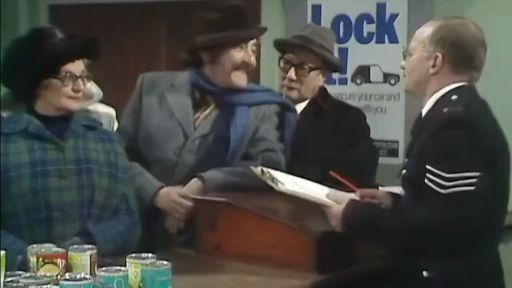
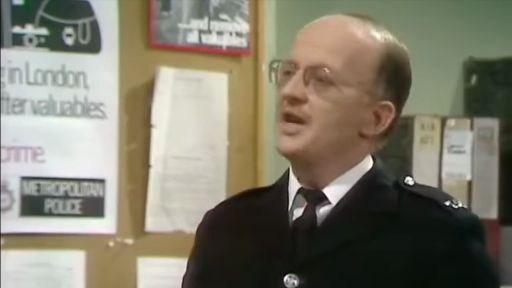
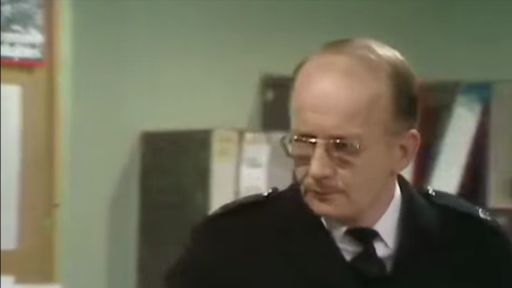
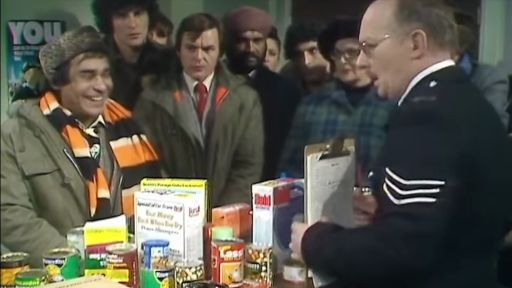
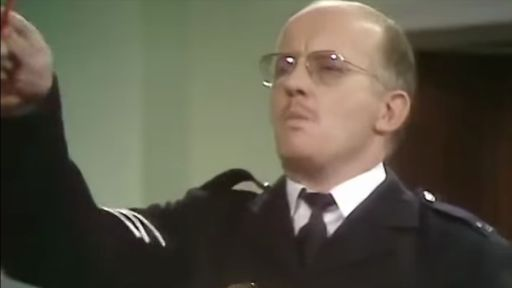
...
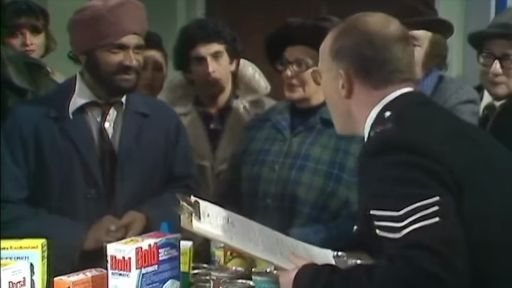
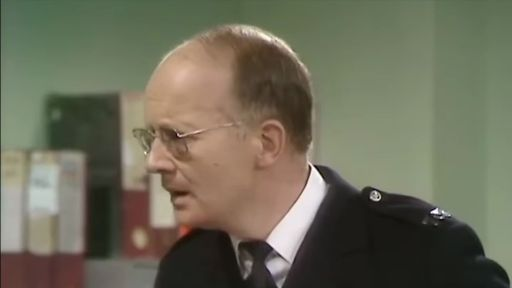
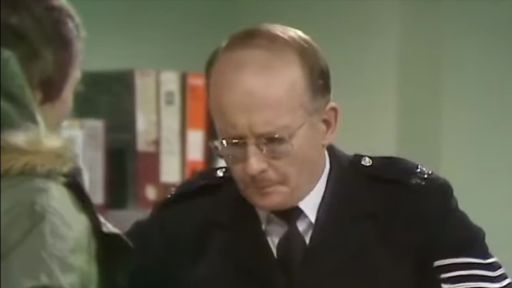
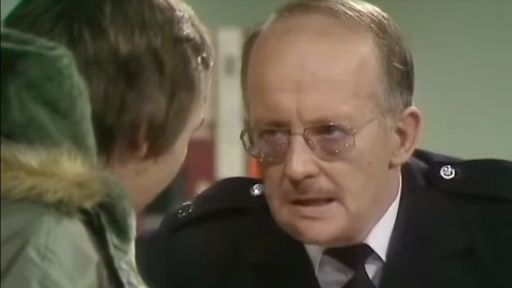
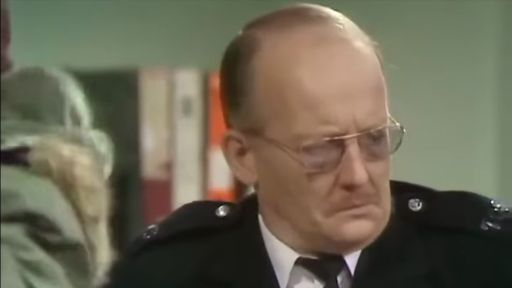

time: 2.3 ms (started: 2026-08-25 22:17:15 +05:30)


In [36]:
fused

# Video Part 2 - Tom and Jerry

In [37]:
VIDEO_PATH = "/Users/shivam13juna/Documents/scaler/GEN_AI_REF/AI Modalities: Video/videos/tom_and_jerry.mp4"

time: 149 µs (started: 2026-08-25 22:21:04 +05:30)


In [38]:
# Read metadata WITHOUT decoding a single frame (cheap).
cap      = cv2.VideoCapture(VIDEO_PATH)
fps      = cap.get(cv2.CAP_PROP_FPS) or 25.0
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
H        = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
W        = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
cap.release()

print(f"shape (T,H,W,C) : ({n_frames}, {H}, {W}, 3)")
print(f"fps / duration  : {fps:.2f} fps  /  {n_frames/fps:.1f} s")
print(f"raw decoded RGB : {n_frames * H * W * 3 / 1e6:,.0f} MB in memory")

# The translation that actually drives every decision: frames -> tokens -> dollars.
TOK_PER_HIGH_FRAME = 765          # ~a 1024px frame at detail="high"
PRICE_PER_1M_INPUT = 2.50         # illustrative $ / 1M input tokens -- CHECK CURRENT PRICING
tok_all = n_frames * TOK_PER_HIGH_FRAME

print(f"\nif you naively sent EVERY frame at high detail:")
print(f"  {n_frames} frames x {TOK_PER_HIGH_FRAME} tok = {tok_all:,} image-tokens")
print(f"  ~= {tok_all/128_000:.1f}x a 128k context window, "
      f"~${tok_all/1e6*PRICE_PER_1M_INPUT:,.2f} per call")
print("  -> impossible. The whole game is sampling FEW frames well.")

shape (T,H,W,C) : (1654, 720, 1280, 3)
fps / duration  : 25.00 fps  /  66.2 s
raw decoded RGB : 4,573 MB in memory

if you naively sent EVERY frame at high detail:
  1654 frames x 765 tok = 1,265,310 image-tokens
  ~= 9.9x a 128k context window, ~$3.16 per call
  -> impossible. The whole game is sampling FEW frames well.
time: 6.07 ms (started: 2026-08-25 22:21:04 +05:30)


In [48]:
NUM_FRAMES, MAX_SIDE = 36, 512

# Which frame indices do we want? Uniformly spaced across the whole clip.
wanted = set(np.linspace(0, n_frames - 1, NUM_FRAMES).round().astype(int).tolist())

cap = cv2.VideoCapture(VIDEO_PATH)
frames, stamps, i = [], [], 0
while True:
    ok, bgr = cap.read()               # decode SEQUENTIALLY -- seeking lies on some codecs
    if not ok:
        break
    if i in wanted:
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)      # GOTCHA: OpenCV decodes BGR!
        h, w = rgb.shape[:2]
        scale = min(1.0, MAX_SIDE / max(h, w))          # shrink only, never upscale
        if scale < 1.0:
            rgb = cv2.resize(rgb, (int(w * scale), int(h * scale)))
        frames.append(rgb)
        stamps.append(i / fps)                          # REMEMBER WHEN -- Part 8 needs it
    i += 1
cap.release()

print(f"decoded {i} frames, kept {len(frames)}")
print(f"timestamps (s): {[round(t, 1) for t in stamps]}")
print(f"frame shape after resize: {frames[0].shape}")

decoded 1654 frames, kept 36
timestamps (s): [0.0, 1.9, 3.8, 5.7, 7.6, 9.4, 11.3, 13.2, 15.1, 17.0, 18.9, 20.8, 22.7, 24.6, 26.4, 28.3, 30.2, 32.1, 34.0, 35.9, 37.8, 39.7, 41.6, 43.4, 45.3, 47.2, 49.1, 51.0, 52.9, 54.8, 56.7, 58.6, 60.4, 62.4, 64.2, 66.1]
frame shape after resize: (288, 512, 3)
time: 604 ms (started: 2026-08-25 22:25:06 +05:30)


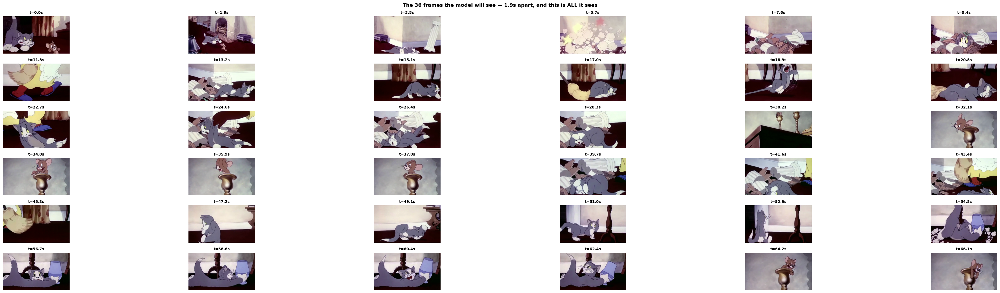

time: 760 ms (started: 2026-08-25 22:25:45 +05:30)


In [51]:
# Look at exactly what the model will receive. Nothing else -- no motion,
# no audio, no order, unless you say so.
fig, ax = plt.subplots(6, 6, figsize=(40, 10))
for a in ax.ravel():
    a.axis("off")
for a, f, t in zip(ax.ravel(), frames, stamps):
    a.imshow(f); a.set_title(f"t={t:.1f}s", fontsize=9)
fig.suptitle(f"The {len(frames)} frames the model will see — {stamps[1]-stamps[0]:.1f}s apart, "
             "and this is ALL it sees", fontweight="bold")
fig.tight_layout(); plt.show()

message has 74 parts: 1 preamble + 36 labels + 36 images + 1 question


[{'type': 'text',
  'text': 'These are frames sampled IN ORDER from one short video; each is labeled with its timestamp. Reason about what happens over time.'},
 {'type': 'text', 'text': '[frame @ 0.0s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 1.9s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 3.8s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 5.7s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 7.6s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 9.4s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', 'text': '[frame @ 11.3s]'},
 {'type': 'image_url',
  'image_url': {'url': '',
   'detail': 'low'}},
 {'type': 'text', '
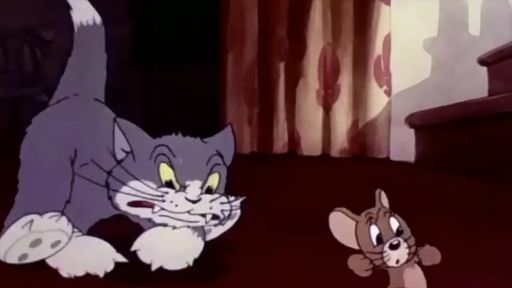
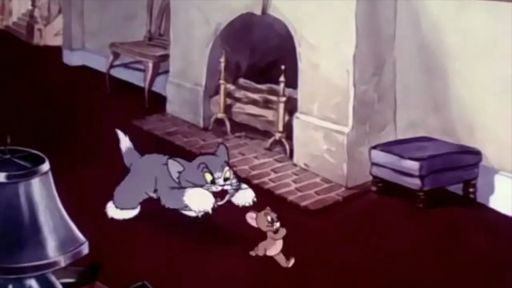
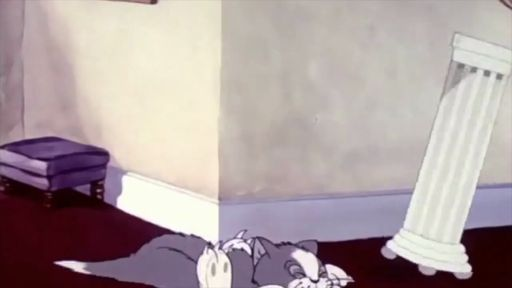
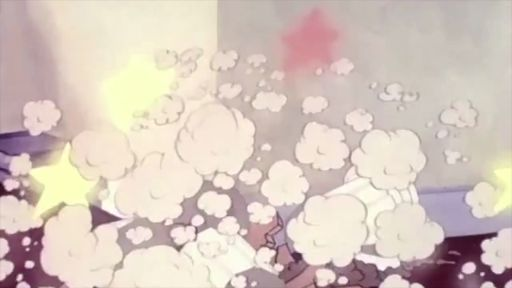
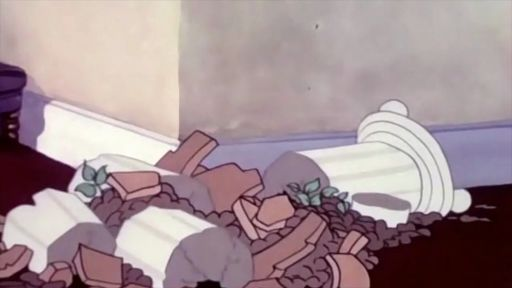
...
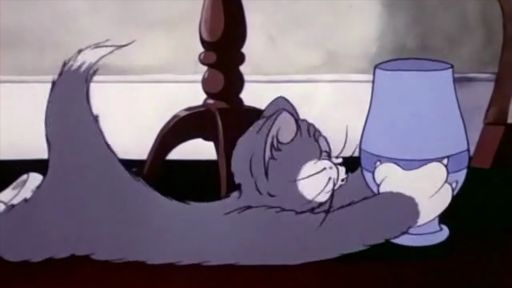
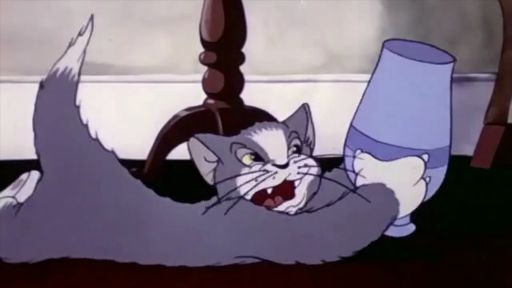
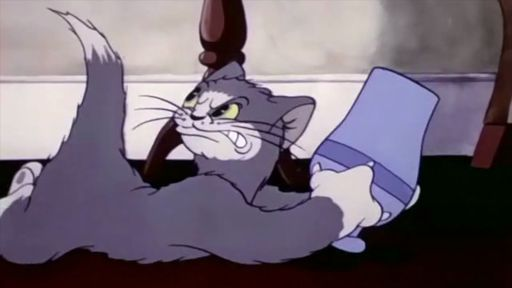
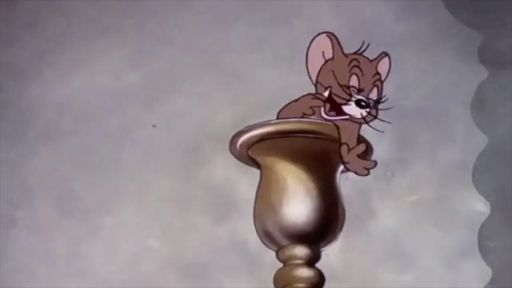
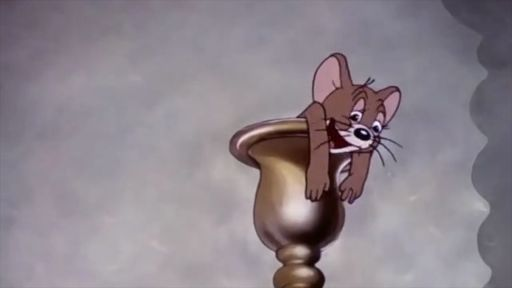

time: 16.5 ms (started: 2026-08-25 22:27:22 +05:30)


In [52]:
def frame_to_data_url(rgb, quality=80):
    bgr = cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)          # imencode wants BGR back
    ok, buf = cv2.imencode(".jpg", bgr, [cv2.IMWRITE_JPEG_QUALITY, quality])
    return "data:image/jpeg;base64," + base64.b64encode(buf).decode("ascii")


content = [{"type": "text",
            "text": ("These are frames sampled IN ORDER from one short video; each is "
                     "labeled with its timestamp. Reason about what happens over time.")}]

for t, f in zip(stamps, frames):
    content.append({"type": "text", "text": f"[frame @ {t:.1f}s]"})      # order + time
    content.append({"type": "image_url",
                    "image_url": {"url": frame_to_data_url(f), "detail": "low"}})

content.append({"type": "text",
                "text": "In 2-3 sentences, describe what happens across the clip."})

print(f"message has {len(content)} parts: 1 preamble + "
      f"{len(frames)} labels + {len(frames)} images + 1 question")

content

In [53]:

# GOTCHA: gpt-5-* are REASONING models. Hidden reasoning tokens are billed against
# max_completion_tokens BEFORE any visible text -- too small a cap and the reasoning
# eats the whole budget and content comes back "". Give it headroom.
resp = client.chat.completions.create(
    model=VISION_MODEL,
    max_completion_tokens=2000,
    messages=[{"role": "user", "content": content}],
)

pretty_print(resp.choices[0].message.content)
print("\n[usage]", resp.usage)

A gray cat chases a small brown mouse around a room. Their pursuit ends in a big
crash as a column and nearby furniture are toppled, leaving the cat battered and
exhausted while the mouse escapes and climbs to a safe perch (a candlestick),
leaving the cat defeated for the moment.

[usage] CompletionUsage(completion_tokens=1668, prompt_tokens=8108, total_tokens=9776, completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=1600, rejected_prediction_tokens=0), prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))
time: 14.7 s (started: 2026-08-25 22:27:25 +05:30)


In [54]:
# --- pull the audio track out as a 16 kHz mono WAV --------------------------
import imageio_ffmpeg
FFMPEG = imageio_ffmpeg.get_ffmpeg_exe()
AUDIO_PATH = "clip_audio.wav"

# -vn drops the video; pcm WAV is universally readable (no codec risk).
subprocess.run([FFMPEG, "-y", "-i", VIDEO_PATH, "-vn", "-ac", "1", "-ar", "16000",
                AUDIO_PATH], capture_output=True, text=True)

y_clip, _ = sf.read(AUDIO_PATH, dtype="float32")
print(f"extracted -> {AUDIO_PATH}  "
      f"({os.path.getsize(AUDIO_PATH)/1e6:.2f} MB, {len(y_clip)/SR:.1f}s, 16 kHz mono)")
display(Audio(y_clip, rate=SR))

extracted -> clip_audio.wav  (2.12 MB, 66.2s, 16 kHz mono)


time: 104 ms (started: 2026-08-25 22:27:40 +05:30)


In [55]:
# --- transcribe WITH segment timestamps ------------------------------------
# whisper-1 + verbose_json is the combination that returns segments; the newer
# gpt-4o-transcribe (Part 5) does not.
with open(AUDIO_PATH, "rb") as fh:
    tr = client.audio.transcriptions.create(
        model=SEGMENT_ASR,
        file=fh,
        response_format="verbose_json",
        timestamp_granularities=["segment"],
    )

segments = [{"start": s.start, "end": s.end, "text": s.text.strip()} for s in tr.segments]

print(f"{len(segments)} segments over {len(y_clip)/SR:.1f}s:\n")
for s in segments:
    print(f"  [{s['start']:5.1f}-{s['end']:5.1f}s] {s['text']}")
print("  ...")

5 segments over 66.2s:

  [  0.0- 18.0s] Jasper? Jasper? Hmm, that no good cat. Just a minute, you good-for-nothin' cheap
  [ 18.0- 27.0s] fur coat. Now would you just look, just look at that mess you made. Now understand this
  [ 27.0- 38.0s] Jasper, if you break one more thing, you are going out. O-U-T, out. That's clear, isn't
  [ 38.0- 45.0s] it? One more breaking and you're going out. Now get out of my sight before I get mad.
  [ 57.0- 59.0s] O-U-T.
  ...
time: 4.47 s (started: 2026-08-25 22:27:40 +05:30)


In [56]:
# --- FUSION: transcript + a few keyframes -> a grounded, time-cited answer ---
# This is the pattern you ship. The transcript is the 'what was said'; the
# keyframes are the 'what was shown'. Together, cheaply, they beat dense frames.
transcript_block = "\n".join(
    f"[{s['start']:.1f}-{s['end']:.1f}s] {s['text']}" for s in segments)



fused = [{"type": "text",
          "text": "TRANSCRIPT (timestamped):\n" + transcript_block +
                  "\n\nBelow are a few keyframes for visual context."}]

for t, f in zip(stamps, frames):
    fused.append({"type": "text", "text": f"[frame @ {t:.1f}s]"})
    fused.append({"type": "image_url",
                  "image_url": {"url": frame_to_data_url(f), "detail": "low"}})

fused.append({"type": "text",
              "text": "Summarize what happens in this clip, citing timestamps."})

# 2000 was enough in Part 8 and is NOT enough here: 43 transcript segments is a lot
# more to reason over, and the hidden reasoning tokens are spent BEFORE any visible
# text. At 2000 this call returns "" and raises nothing. Budget generously.
resp_fused = client.chat.completions.create(
    model=VISION_MODEL,
    max_completion_tokens=6000,
    messages=[{"role": "user", "content": fused}],
)

pretty_print(resp_fused.choices[0].message.content)
print("\nframes-only prompt tokens :", resp.usage.prompt_tokens)
print("fused        prompt tokens :", resp_fused.usage.prompt_tokens)
print("reasoning tokens spent     :",
      resp_fused.usage.completion_tokens_details.reasoning_tokens)

In this short, a cat named Jasper causes a mess, chases a mouse, and ends up
battered but (for the moment) still in the house while the mouse gets the upper
hand.  - 0:00–0:18: The owner scolds Jasper for being a “no good cat” and for
the mess he’s made. - 0:18–0:38: The scolding continues as the owner points to
the mess and warns Jasper. - 0:38–0:45: The owner repeats the threat: one more
broken thing and Jasper will be out; tells him to leave. - 0:57–0:59: The owner
reiterates, “O-U-T.” - 0:18–0:45 (visual sequence): Jasper chases a small mouse
around the room, triggering a collapse of furniture and debris (a toppled column
and rubble). - 1:17–1:39: Jasper is shown buried and struggling through the
wreckage; later he drags himself out and resumes from the floor. - 1:32–1:39 and
2:31–2:50: A brown mouse peeks out atop a pedestal/ornament amid the debris,
while Jasper recovers and continues the chaotic sequence. - 4:50–5:20 (approx.,
frames around 49–60s): The cat is shown crouched/pee

[{'type': 'text',
  'text': "TRANSCRIPT (timestamped):\n[0.0-1.0s] What's your name?\n[1.0-3.0s] Porfavor.\n[3.0-6.0s] How do you spell that?\n[6.0-7.0s] That's not his name.\n[7.0-10.0s] Oh, giving me a false name, eh?\n[10.0-11.0s] Porfavor.\n[11.0-16.0s] I'll come back to you, Mr. Porfavor, or whatever your name is.\n[16.0-17.0s] You.\n[17.0-19.0s] Yes, please.\n[19.0-21.0s] What is your name?\n[21.0-24.0s] Oh, no. What is not my name?\n[24.0-27.0s] I don't want to know what your name is not.\n[27.0-29.0s] What is your name?\n[29.0-31.0s] And I'm telling you it is not.\n[31.0-32.0s] You.\n[32.0-34.0s] What is his name?\n[34.0-35.0s] Nine.\n[35.0-38.0s] Aha. Now we're getting somewhere.\n[38.0-40.0s] Mr. Nine.\n[40.0-41.0s] That is not his name.\n[41.0-42.0s] You just said it was.\n[42.0-45.0s] You ask me if his name is what, and I tell you nine.\n[45.0-47.0s] What is not his name, but also not mine.\n[47.0-49.0s] Oh, God, I'm offended.\n[49.0-51.0s] What is his name?\n[51.0-52.0s] A
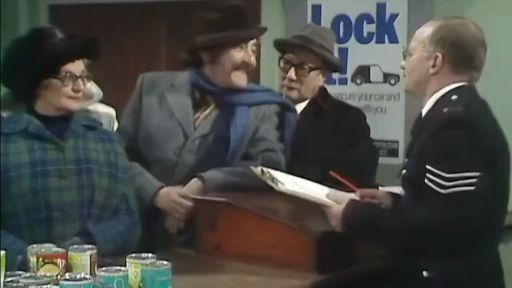
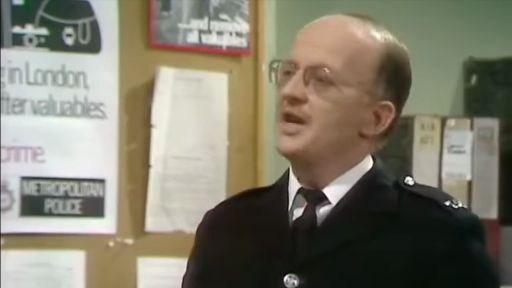
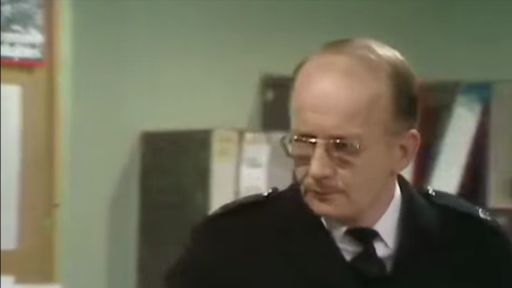
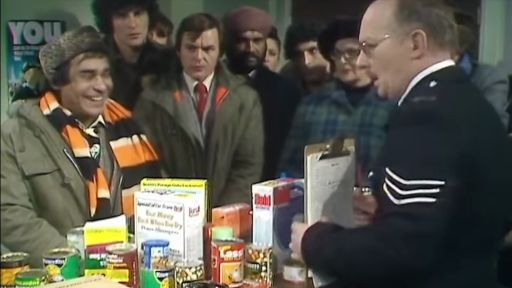
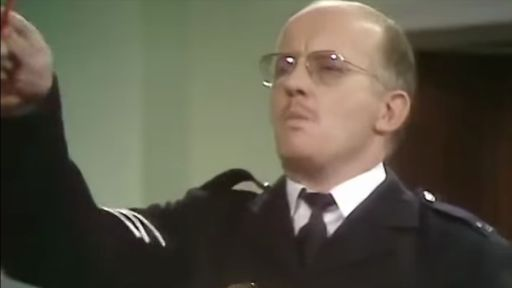
...
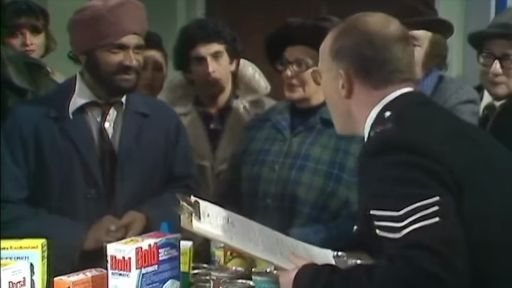
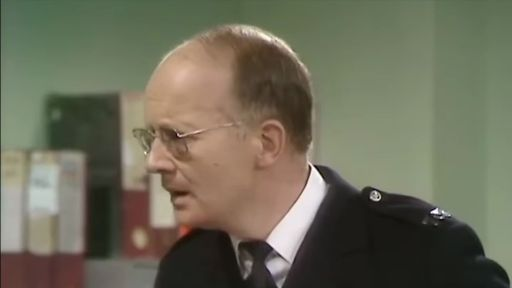
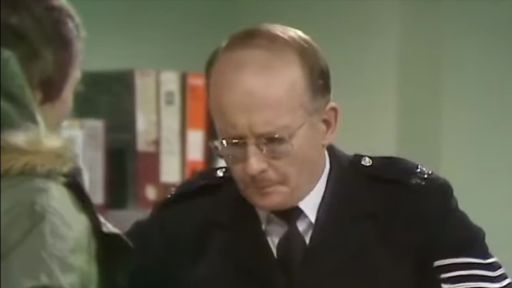
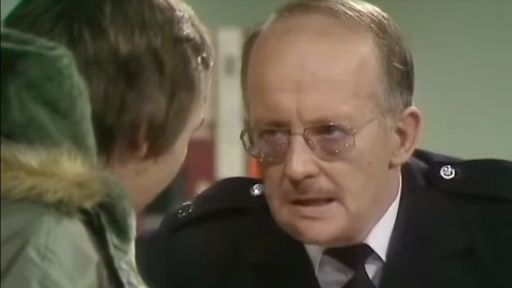
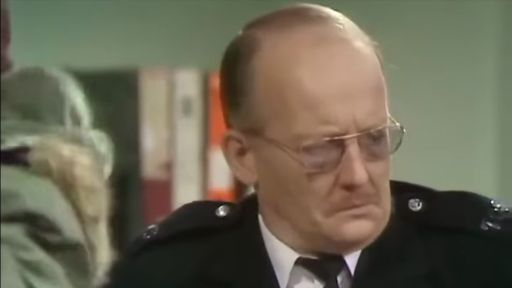

time: 2.3 ms (started: 2026-08-25 22:17:15 +05:30)


In [ ]:
fused

So these days, I don't really type much on ChatGPT. Whenever I want to search for something, everything is just recorded and then it gets converted to text, and then I can search for it.